In [1]:
import os
import pywt
import torch
import random
import pickle
import numpy as np
import matplotlib.pyplot as plt
from types import SimpleNamespace
from quantus.metrics import Complexity
from scipy.fftpack import fft, fftfreq
from torch.utils.data import DataLoader, TensorDataset

from src.models.simple import SimpleCNN
from src.attribution import compute_attribution
from src.evaluation.evaluation import evaluate_attributions


/Users/alicia/Documents/Master/TFM/learnable-masks-explainability-time-series/.env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def set_seed(seed: int = 42):
    random.seed(seed)                          # Python built-in random
    np.random.seed(seed)                       # NumPy random
    torch.manual_seed(seed)                    # CPU random seed
    torch.cuda.manual_seed(seed)               # GPU random seed (if used)
    torch.cuda.manual_seed_all(seed)           # All GPUs (if multiple GPUs)

    # Ensure deterministic behavior
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # Optional: for hash-based operations
    os.environ['PYTHONHASHSEED'] = str(seed)

In [3]:
# set seed
set_seed(42)

# to mps if available otherwise to cpu
device = torch.device('mps' if torch.backends.mps.is_available()  else 'cpu')
print(f"Using device: {device}")

# load the model
model = SimpleCNN(in_channels=1, out_channels=2, hidden_size=64, kernel_size=5)

# load the model weights
model.load_state_dict(torch.load("./model/checkpoint/simpleCNN_1.pth", map_location=torch.device('mps')))
model.to(device)

Using device: mps


SimpleCNN(
  (cnn): Sequential(
    (0): Conv1d(1, 64, kernel_size=(5,), stride=(1,), padding=(2,))
    (1): ReLU()
    (2): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv1d(64, 2, kernel_size=(5,), stride=(1,))
    (4): AdaptiveAvgPool1d(output_size=1)
    (5): Flatten(start_dim=1, end_dim=-1)
  )
)

In [4]:
set_seed(42)

# Load and shape synthetic test data
x = None
y = None

# load the data from synthetic data
data_folder = "./data/synthetic/test_1"
data_files = os.listdir(data_folder)
for file in data_files:
    if "samples_0" in file:
        if x is None and y is None:
            x = np.load(os.path.join(data_folder, file))
            y = np.zeros(5000)
        else:
            x = np.concatenate([x, np.load(os.path.join(data_folder, file))])
            y = np.concatenate([y, np.zeros(5000)])
    elif "samples_1" in file:
        if x is None and y is None:
            x = np.load(os.path.join(data_folder, file))
            y = np.ones(5000)
        else:
            x = np.concatenate([x, np.load(os.path.join(data_folder, file))])
            y = np.concatenate([y, np.ones(5000)])
    else:
        print("File not recognized")
        continue
    

x = x[:, np.newaxis, :]

print(x.shape)
print(y.shape)

# convert the data to torch tensors
x = torch.tensor(x, dtype=torch.float32)
y = torch.tensor(y, dtype=torch.long)

# Shuffle indices once
indices = torch.randperm(len(x))

# Apply the shuffle
x_shuffled = x[indices]
y_shuffled = y[indices]

# create the dataset
dataset = TensorDataset(x_shuffled, y_shuffled)

# create the DataLoader
test_loader = DataLoader(dataset, batch_size=128)


(10000, 1, 16)
(10000,)


In [5]:
attributions = {}
attributions['deletion'] = {}
attributions['insertion'] = {}
predictions = []
labels = []

# prediction
for batch in test_loader:
    # get data
    x, y = batch
    x = x.to(device)
    output = model(x)

    predictions.append(output)
    labels.append(y)

# concatenat the predictions and the labels through the first dim
predictions = torch.cat(predictions, dim=0)
labels = torch.cat(labels, dim=0)

In [6]:
correct = 0
for i in range(len(predictions)):
    if predictions[i].argmax() == labels[i]:
        correct += 1

print(f"Accuracy: {correct / len(predictions)}")

Accuracy: 1.0


In [7]:
# save it in the attributions dict
attributions['predictions'] = predictions
attributions['labels'] = labels

In [8]:
# evaluate wavelet
fs = 16
batch_size = 128
wavelet = 'db'
w_len = 1
rescaled = True
level = pywt.dwt_max_level(fs, 'db1')
key_ = f'wavelet_{wavelet}{w_len}_{level}_{batch_size}'
print(key_)

wavelet_db1_4_128


In [9]:
# set the seed for reproducibility
set_seed(42)

# compute the attributions
method = 'wavelet'

args = SimpleNamespace(wavelet=wavelet, len_w=w_len, level=level, sample_freq=fs)
print(args.wavelet)
print(args.len_w)
print(args.level)
print(args.sample_freq)

attrs, masks = compute_attribution(method = method, model = model, test_loader= test_loader, args = args, device=device, regularization='l2')

db
1
4
16
Batch 0 of 79
Sample 0 of 128
Epoch 0: Loss=1.2958, Target=1.2858, Reg=0.0100
Epoch 10: Loss=0.6165, Target=0.6061, Reg=0.0104
Epoch 20: Loss=0.4110, Target=0.3880, Reg=0.0230
Epoch 30: Loss=0.3731, Target=0.3418, Reg=0.0312
Epoch 40: Loss=0.3642, Target=0.3303, Reg=0.0339
Epoch 50: Loss=0.3605, Target=0.3266, Reg=0.0338
Epoch 60: Loss=0.3581, Target=0.3252, Reg=0.0330
Epoch 70: Loss=0.3565, Target=0.3245, Reg=0.0320
Epoch 80: Loss=0.3555, Target=0.3241, Reg=0.0314
Epoch 90: Loss=0.3549, Target=0.3239, Reg=0.0310
Epoch 100: Loss=0.3545, Target=0.3238, Reg=0.0307
Epoch 110: Loss=0.3542, Target=0.3236, Reg=0.0306
Epoch 120: Loss=0.3539, Target=0.3235, Reg=0.0305
Epoch 130: Loss=0.3537, Target=0.3233, Reg=0.0304
Epoch 140: Loss=0.3535, Target=0.3231, Reg=0.0304
Epoch 150: Loss=0.3533, Target=0.3230, Reg=0.0303
Epoch 160: Loss=0.3531, Target=0.3229, Reg=0.0302
Epoch 170: Loss=0.3530, Target=0.3228, Reg=0.0302
Epoch 180: Loss=0.3529, Target=0.3228, Reg=0.0301
Epoch 190: Loss=0.352

In [10]:
attributions[key_] = attrs
attributions[f'filtermasks_{key_}'] = masks

In [11]:
print(attributions.keys())
print(key_)
print(len(attributions[key_]))
print(len(attrs[0]))
print(len(masks))
print(len(test_loader))

dict_keys(['deletion', 'insertion', 'predictions', 'labels', 'wavelet_db1_4_128', 'filtermasks_wavelet_db1_4_128'])
wavelet_db1_4_128
79
128
79
79


In [ ]:
# # read data
# folder = 'public/simple/'
# path = f'{folder}{key_}_results_3_rescaled.pkl'

# with open(path, 'rb') as f:
#     attributions = pickle.load(f)
# print(f"Attributions loaded from {path}")

FileNotFoundError: [Errno 2] No such file or directory: 'public/simple/wavelet_db1_4_128_results_3_rescaled.pkl'

In [13]:
# print the type of attributions[key_]
print(type(attributions[key_]))

<class 'list'>


In [14]:
print(type(attributions[key_]))
print(len(attributions[key_]))
print(len(attributions[key_][0]))
print(len(attributions[key_][0][0]))
print(len(attributions[key_][0][0][0]))
print(len(attributions[key_][0][0][0][0]))

<class 'list'>
79
128
1
16
5


In [15]:
key_2 = f'filtermasks_{key_}'
print(type(attributions[key_2]))
print(len(attributions[key_2]))
print(len(attributions[key_2][0]))
print(len(attributions[key_2][0][0]))
print(len(attributions[key_2][0][0][0]))

<class 'list'>
79
128
16
5


In [16]:
set_seed(42)

# compute accuracy scores
quantiles = np.arange(0, 1.05, 0.05)
for mode in ['deletion', 'insertion']:
    if not mode in attributions.keys():
        attributions[mode] = {}
    
    acc_scores = evaluate_attributions(model, test_loader, attributions[key_], quantiles=quantiles, mode=mode, device=device, domain='wavelet', wavelet='db1')
    attributions[mode][key_] = acc_scores

Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Attribution shape: torch.Size([128, 1, 16, 5])
Data shape: torch.Size([128, 1, 16, 5])
Att

In [17]:
print(attributions.keys())

dict_keys(['deletion', 'insertion', 'predictions', 'labels', 'wavelet_db1_4_128', 'filtermasks_wavelet_db1_4_128'])


In [18]:
set_seed(42)

# stores the accuracy, mean true class prob and cross-entropy loss throughout the quantiles
for k in attributions['insertion'].keys():
    print(k)
    print(len(attributions['insertion'][k]))
    print(len(attributions['insertion'][k][0]))
    for val in range(len(attributions['insertion'][k])):
        print(attributions['insertion'][k][val])

wavelet_db1_4_128
3
21
[0.5, 0.7172, 0.6092, 0.6304, 0.6408, 0.6598, 0.6954, 0.7285, 0.7482, 0.7824, 0.7996, 0.875, 0.9218, 0.9281, 0.9955, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[0.5000000302314759, 0.7414663179397583, 0.6663470467567444, 0.6769464784622192, 0.6822058856010437, 0.6921624198913574, 0.7199134729385376, 0.748755046081543, 0.7642915516853332, 0.7910238453865052, 0.8046431601524353, 0.8706270168304443, 0.9150621887207031, 0.9328823082923889, 0.9954836715698242, 0.9999250652313233, 0.9999954624176025, 0.999998528289795, 0.9999994164466858, 0.9999994156837463, 0.9999994638442993]
[63.529059290885925, 21.996248736977577, 29.777429431676865, 30.55719366669655, 30.422187954187393, 30.143247693777084, 27.898668363690376, 26.470861479640007, 26.321044251322746, 24.901284888386726, 24.582873970270157, 16.247030071914196, 10.187933206558228, 6.560662439092994, 0.27077880489162, 0.0029462899661325537, 0.0001782751599250787, 5.7755567524964135e-05, 2.3253195635675183e-05, 2.3241088399572618e-

In [19]:
complexities = {}
grad_complexties = {}
comp = Complexity()

In [20]:
set_seed(42)
# for att in attributions:
#     if att == 'insertion':
#         print(attributions['insertion'].keys())
    
# for key in attributions['insertion'].keys():
key = 'wavelet_db1_4_128'
if not key in complexities.keys():
    print('first')
    complexities[key] = []
    grad_complexties[key] = []

scores = []
grad_scores = []

for i in range(len(attributions[key])):
    expl = np.reshape(attributions[key][i], (attributions[key][i].shape[0], -1))
    expl = expl.to(dtype=torch.float32).numpy()
    
    ex = np.maximum(attributions[key][i].numpy(), 0)
    if 'filterbank' in key:
        ex = np.transpose(ex, (0, 2, 1))

    # min max normalize
    ex_min = np.min(ex, axis = -1, keepdims=True)
    ex_max = np.max(ex, axis = -1, keepdims=True)
    ex = (ex - ex_min) / (ex_max - ex_min + 1e-10)
    # ex = (ex - np.min(ex, axis = -1, keepdims=True)) / (np.max(ex, axis = -1, keepdims=True) - np.min(ex, axis = -1, keepdims=True) + 1e-10)
    expl_grad = np.abs(np.diff(ex, axis = -1)).sum(axis=-1)
    expl_grad = np.reshape(expl_grad, (attributions[key][i].shape[0], -1))

    expl = np.maximum(expl, 0)
    # check if all expl values are zero
    if np.all(expl == 0):
        print("All zeros")
        # add a small epsilon to avoid division by zero
        expl = np.ones_like(expl) * 1e-10

    # to compute complexities it has to be a numpy float32 otherwise err
    complexity = comp.evaluate_batch(expl, expl)
    complexity = np.nan_to_num(complexity)
    expl_grad = np.nan_to_num(expl_grad)
    scores += complexity.tolist()
    grad_scores += list(expl_grad)

complexities[key].append(np.mean(scores))
grad_complexties[key].append(np.mean(grad_scores))

print(complexities)
print(grad_complexties)

first
{'wavelet_db1_4_128': [np.float64(2.1422000853078225)]}
{'wavelet_db1_4_128': [np.float32(1.0535816)]}


In [21]:
import pickle

# dump to file
folder = 'public/simple/'
path = f'{folder}{key_}_results_1_0.1_l2.pkl'

with open(path, 'wb') as f:
    pickle.dump(attributions, f)
print(f"Saved to {path}")

Saved to public/simple/wavelet_db1_4_128_results_1_0.1_l2.pkl


In [22]:
def plot_freq_heatmap(signal, attribution, fs=100):
    if torch.is_tensor(signal):
        signal = signal.cpu().numpy()

    # Compute FFT
    N = len(signal)
    freq = fftfreq(N, d=1/fs)  # Frequency bins
    magnitude = np.abs(fft(signal))  # Magnitude of FFT

    # Compute frequency bands
    freq_bands = [fs /  (2 ** (j + 1)) for j in range(level)]   # bands
    freq_bands.append(0)                                        # lowest frequency
    freq_bands = freq_bands[::-1]                                    
    print(freq_bands)

    # Keep only positive frequencies
    pos_mask = freq >= 0
    freq = freq[pos_mask]
    magnitude = magnitude[pos_mask]

    # sum the attribution scores across the time dimension
    attribution = np.sum(attribution, axis=0)
    print(attribution.shape)

    # Normalize attribution scores to [0,1]
    attr_resized = np.interp(freq, freq_bands, attribution)
    # attr_resized = np.interp(freq, np.linspace(freq.min(), freq.max(), len(attribution)), attribution)
    attr_norm = (attr_resized - np.min(attr_resized)) / (np.max(attr_resized) - np.min(attr_resized) + 1e-10)

    # Create a 2D grid for heatmap
    freq_grid, mag_grid = np.meshgrid(freq, magnitude)
    attr_grid = np.tile(attr_norm[:-1], (len(magnitude) - 1, 1))  # Repeat attribution scores along the magnitude axis

    # Plot heatmap
    plt.figure(figsize=(10, 5))
    plt.plot(freq, magnitude, label="FFT Magnitude", color='black', alpha=0.6)
    plt.pcolormesh(freq_grid, mag_grid, attr_grid, shading='auto', cmap='Greens')
    plt.colorbar(label="Normalized Attribution Score")
    plt.xlabel("Frequency [Hz]")
    plt.ylabel("Magnitude")
    plt.title("Attribution Heatmap in Frequency Domain")
    plt.show()

In [33]:
import pywt

def plot_scaleogram_wav_heatmap(signal, attribution, prediction:int, label:int, fs=1000, level=9, ):
    # print(attribution.shape)

    # Compute frequency bands
    freq_bands = [fs /  (2 ** (j + 1)) for j in range(level)]   # bands
    freq_bands.append(0)                                        # lowest frequency
    # print(freq_bands)

    time = np.linspace(0, signal / fs, signal)
    

    # normalize attribution scores to [0,1]
    # attribution = np.abs(attribution)
    # attr_norm = (attribution - attribution.min()) / (attribution.max() - attribution.min() + 1e-10)

    # Create a 2D grid for heatmap
    time_grid, freq_grid = np.meshgrid(time, freq_bands)
    # make attr x one dim smaller
    attr_norm = attribution[1:, 1:]

    # Plot the scaleogram
    plt.figure(figsize=(10, 6))
    plt.pcolormesh(time_grid, freq_grid, attr_norm.T, shading='auto', cmap='Greens')
    plt.colorbar(label="Normalized Attribution Score")
    plt.title(f'Attribution pred:{prediction} true:{label}')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')

    plt.show()

In [34]:
# get one batch
for x, y in test_loader:
    # get the first sequence
    x = x.numpy()

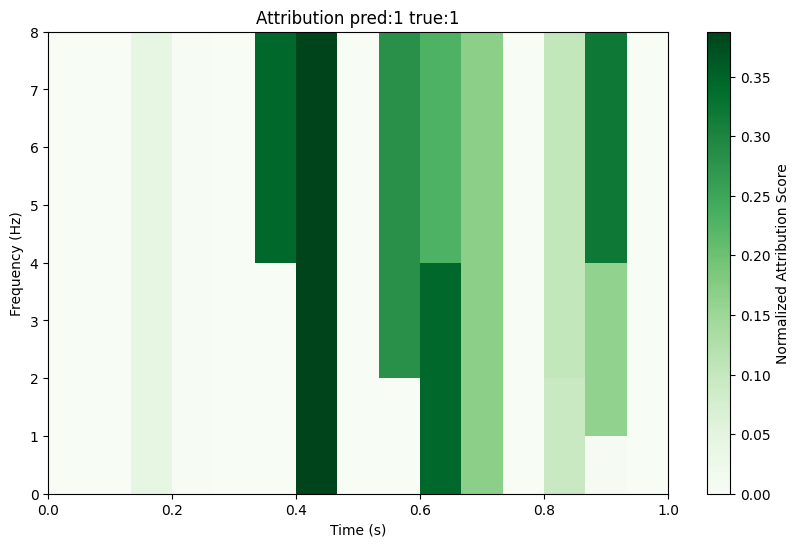

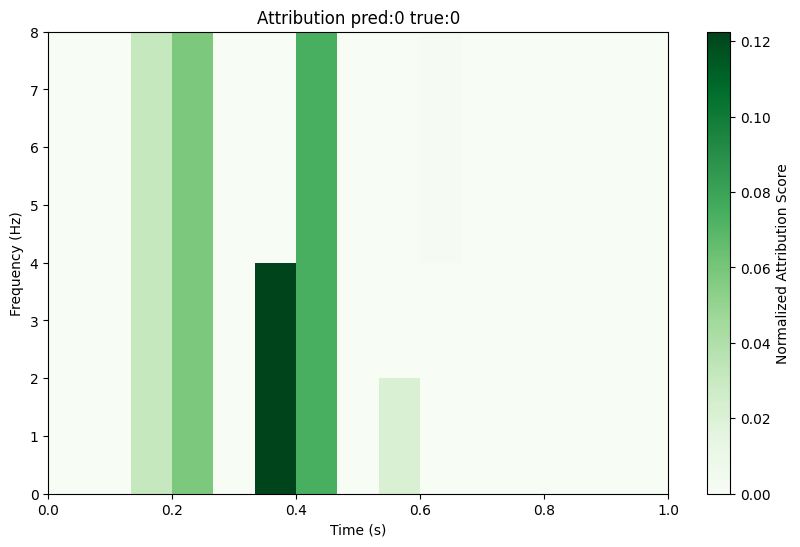

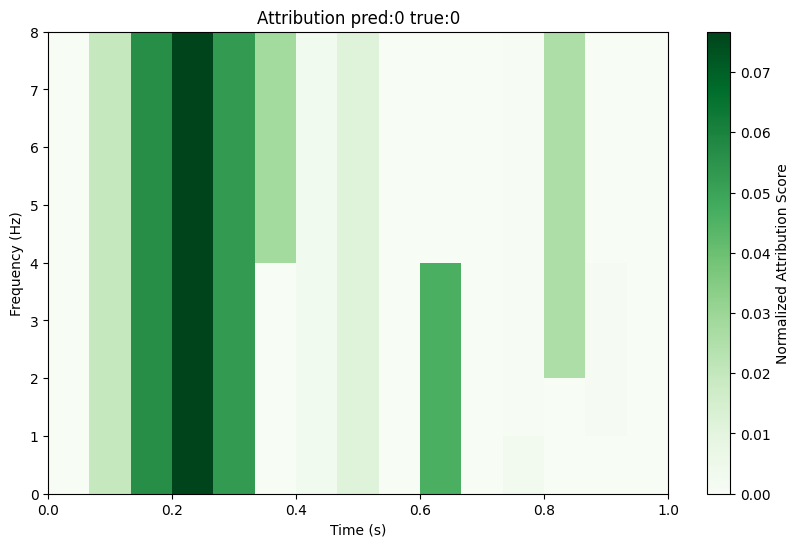

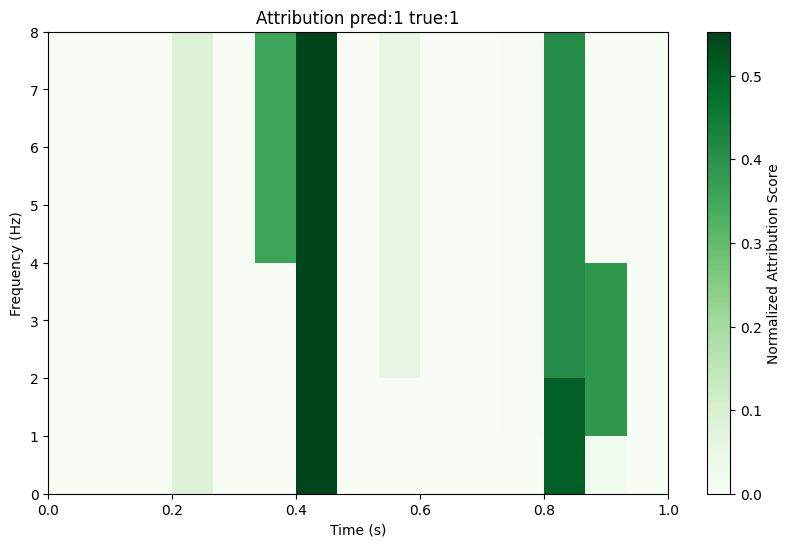

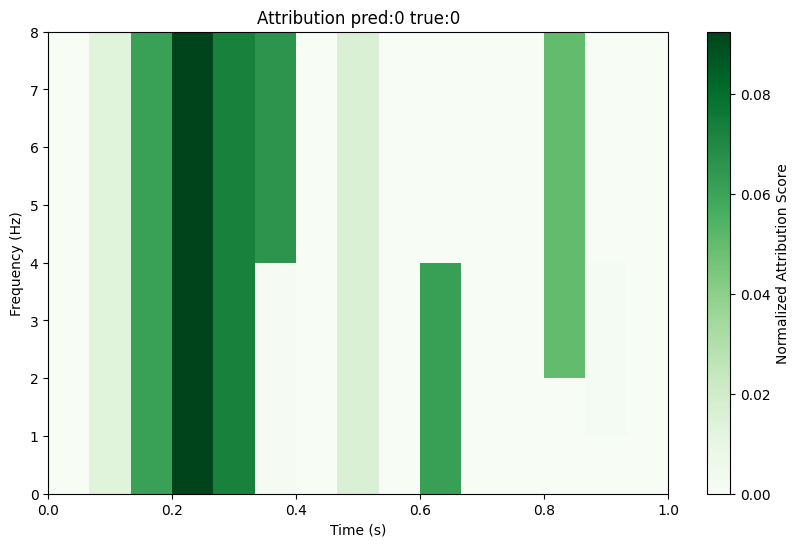

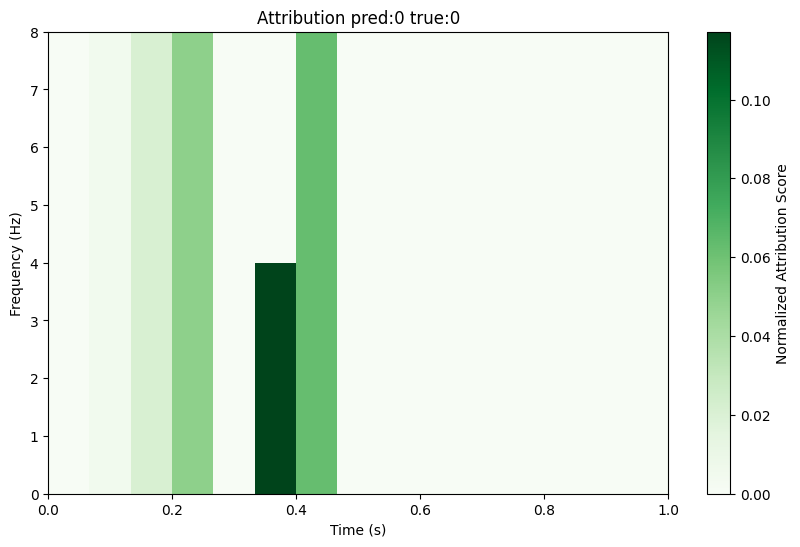

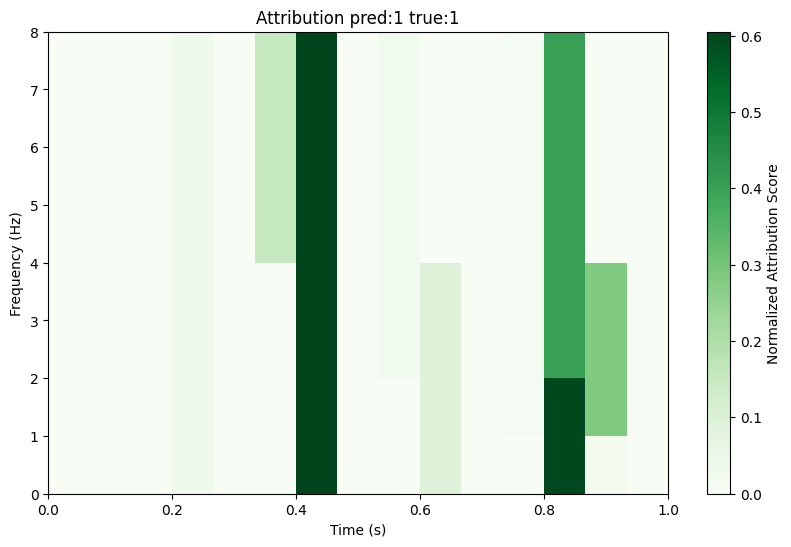

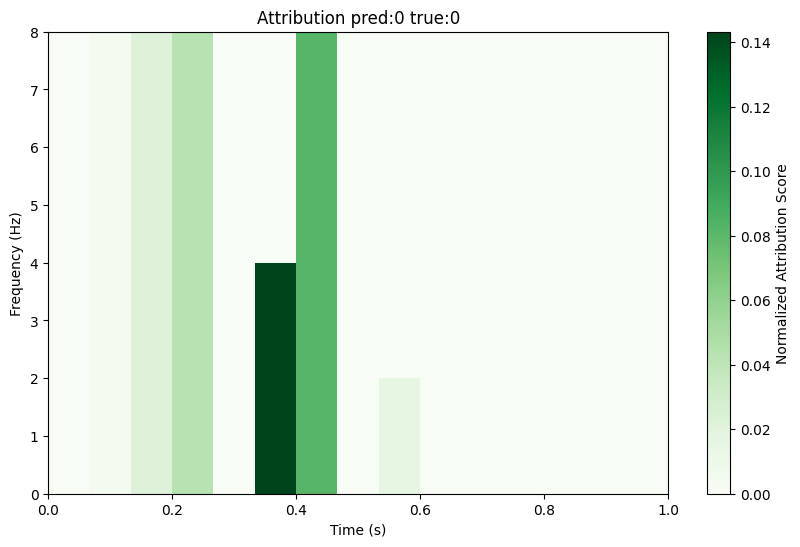

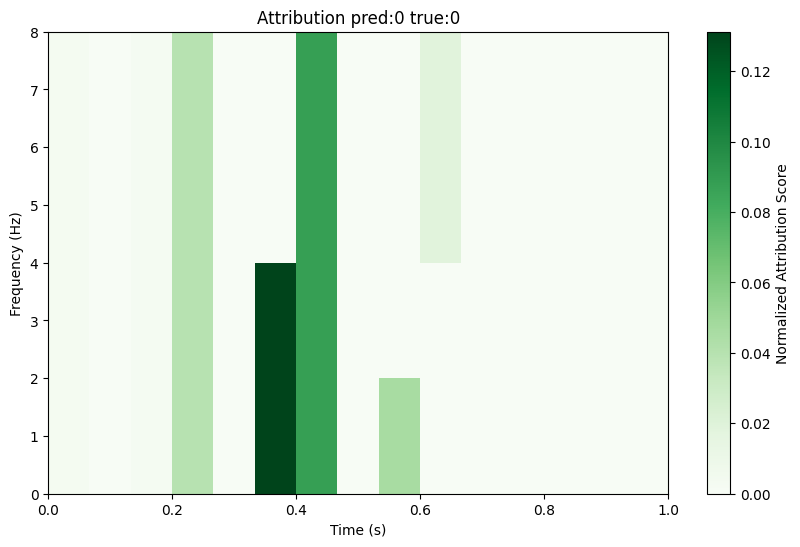

In [35]:
# plot the scores as a heatmap on the original signal
max_level = pywt.dwt_max_level(16, 'db1')

# plot 5 samples
for i in range(1, 10):
    plot_scaleogram_wav_heatmap(len(x[i][0]), attributions['filtermasks_wavelet_db1_4_128'][0][i], prediction=attributions['predictions'][i].argmax(), label=attributions['labels'][i], fs=fs, level=max_level)


10000
Counts of label 0: 5000, label 1: 5000
wavelet_db1_4_128


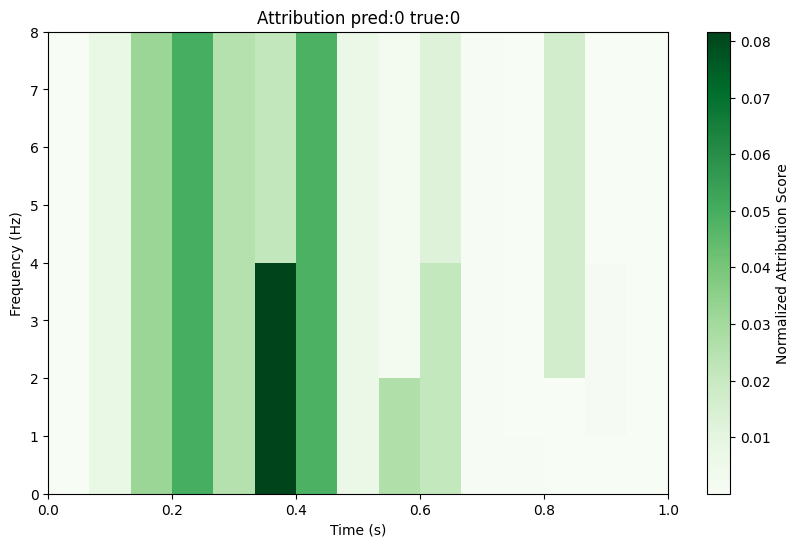

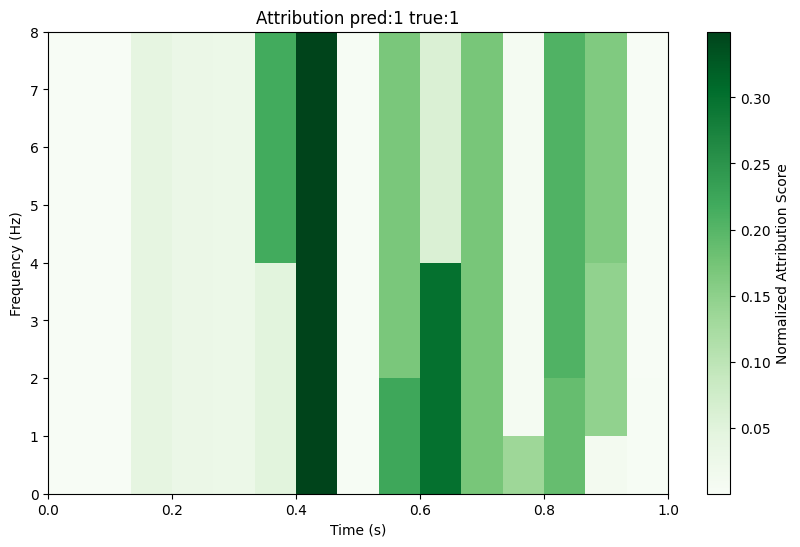

In [36]:
counts_0 = 0
counts_1 = 0

print(len(attributions['labels']))

for i in range(len(attributions['labels'])):
    if attributions['labels'][i] == 0:
        counts_0 += 1
    else:
        counts_1 += 1

print(f"Counts of label 0: {counts_0}, label 1: {counts_1}")

for key in attributions['insertion'].keys():
    print(key)

    method, wavelet, max_level, batch_size = key.split('_')
    max_level = int(max_level)

    key_ = f'filtermasks_{key}'

    masks_0 = np.zeros_like(attributions[key_][0][0])
    masks_1 = np.zeros_like(attributions[key_][0][0])

    index = 0

    for i in range(len(attributions[key_])):
        for j in range(len(attributions[key_][i])):
            # print(index)
            if attributions['labels'][index] == 0:
                masks_0 += attributions[key_][i][j]
            else:
                masks_1 += attributions[key_][i][j]

            index += 1

    masks_0 /= counts_0
    masks_1 /= counts_1

    plot_scaleogram_wav_heatmap(fs, masks_0, prediction=0, label=0, fs=fs, level=max_level)
    plot_scaleogram_wav_heatmap(fs, masks_1, prediction=1, label=1, fs=fs, level=max_level)

In [30]:
def compute_entropy_sample(attribution, epsilon=1e-10):
    abs_attr = np.abs(attribution)
    sum_attr = np.sum(abs_attr) + epsilon
    prob_dist = abs_attr / sum_attr
    entropy = -np.sum(prob_dist * np.log(prob_dist + epsilon))
    return entropy

In [31]:
# Compute the entropy-based complexity
complexity_scores = []

for i in range(len(attributions[key_])):
    attr = np.reshape(attributions[key][i], (attributions[key][i].shape[0], -1))
    scores = []
    # print(attributions[key_][i].shape)
    for sample in attr:
        sample = sample.detach().cpu().numpy()
        c = compute_entropy_sample(sample)
        c = np.nan_to_num(c)
        scores.append(c)
    complexity_scores += scores

# compute the mean
mean_complexity = np.mean(complexity_scores)
print("Complexity Scores:")
print(mean_complexity)

Complexity Scores:
2.1422
